In [1]:
from models import simplecnn
import torch.nn as nn
from torch.optim import SGD
import torch 
def mean_nll(logits, y):
    return nn.functional.binary_cross_entropy_with_logits(logits, y)


class GradientExtractor(nn.Module):
    
    def __init__(self, model, layers):
        super().__init__()
        self.model = model
        self.layers = layers
        self._features = {layer: torch.empty(0) for layer in layers}

    def save_gradients_hook(self, layer_id):
        print(layer_id)
        def fn(module, grad_input, output):
            self._features[layer_id] = output
        return fn

    def forward(self, x):
        return self.model(x)
        #return self._features
args = []
m = simplecnn(args)
model = GradientExtractor(m, ['features.conv1', 'features.conv2'])

opt = SGD(model.parameters(), lr=0.001)

x = torch.randn((10,3,32,32)).float()
y = torch.ones((10)).float()
logits = model(x)

loss = mean_nll(logits.squeeze(), y)
loss.backward()


In [2]:
import torch
import torch.nn as nn
from models import simplecnn
args = []


# These were all generated using ChatGPT 3.5


def generate_mask(weights, method='absolute', t=0.5, asc=True):
    """
    Generate a binary mask for each weight tensor, based on the specified pruning method.

    Args:
        weights (dict): A dictionary mapping weight tensor names to weight tensor values.
        method (str): The pruning method to use. Possible values are 'absolute', 'full', and 'partial'.
        t (float): The threshold value for selecting elements based on magnitude, used only if method is 'absolute'.
        threshold_ratio (float): A value between 0 and 1 specifying the percentile of the largest magnitude values to use as the threshold, used only if method is 'full' or 'partial'.

    Returns:
        dict: A dictionary mapping weight tensor names to binary mask tensors of the same shape.
    """
    mask = {}
    if method == 'absolute':
        mask = generate_mask_magnitude(weights, t, asc = asc)
    if method == 'random':
        mask = generate_random_mask(weights, t)
    elif method == 'full':
        mask = generate_mask_percentile_full(weights, t, asc = asc)
    elif method == 'partial':
        mask = generate_mask_percentile_partial(weights, t, asc = asc)
    else:
        raise ValueError(f"Invalid pruning method: {method}")
    return mask



def generate_random_mask(model, p=0.5):
    """
    Generate a binary mask for each parameter in the model, where each element
    is randomly set to 0 or 1 with probability p.

    Args:
        model (nn.Module): The PyTorch model to generate the masks for.
        p (float): The probability of setting each element of the mask to 1.

    Returns:
        dict: A dictionary mapping parameter names to binary mask tensors of the same shape.
    """
    mask = {}
    for name, param in model.named_parameters():
        if param.requires_grad:
            mask[name] = torch.zeros_like(param).bernoulli_(p).bool()
    return mask

def generate_mask_magnitude(weights, t=0.5, asc=True):
    """
    Generate a binary mask for each weight tensor, where each element is set to 1 if its
    magnitude is greater than t, and 0 otherwise.

    Args:
        weights (dict): A dictionary mapping weight tensor names to weight tensor values.
        t (float): The threshold value for selecting elements based on magnitude.

    Returns:
        dict: A dictionary mapping weight tensor names to binary mask tensors of the same shape.
    """
    mask = {}
    for name, param in weights.items():
        if asc:
            mask[name] = param < t
        else:
            mask[name] = param > t
    return mask

def generate_mask_percentile_full(tensors_dict, threshold_ratio, asc = asc):
    """
    Generate a binary mask for each tensor in the input dictionary, where each element is set to 1 if its magnitude is greater than a threshold value computed as a percentile of the largest magnitude values.

    Args:
        tensors_dict (dict): A dictionary mapping tensor names to tensor values.
        threshold_percentile (float): A value between 0 and 1 specifying the percentile of the largest magnitude values to use as the threshold.

    Returns:
        dict: A dictionary mapping tensor names to binary mask tensors of the same shape as the input tensors.
    """
   

    # Concatenate all tensors in the dictionary along the first dimension
    concatenated_tensor = torch.cat([tensor.view(-1) for tensor in tensors_dict.values()], dim=0)
    
    # Compute the absolute values of the concatenated tensor
    abs_tensor = torch.abs(concatenated_tensor)
    mask_tensor = torch.zeros_like(concatenated_tensor)
    # Compute the threshold value for the specified percentile
    if asc:
        threshold = torch.kthvalue(abs_tensor, int((threshold_ratio) * abs_tensor.numel())[0]
        mask_tensor[abs_tensor < threshold] = 1
    
    else:
        threshold = torch.kthvalue(abs_tensor, int((1 - threshold_ratio) * abs_tensor.numel())[0]
        mask_tensor[abs_tensor > threshold] = 1
    
    
    # Create the mask tensor based on the threshold value

    mask_tensor[abs_tensor > threshold] = 1
    
    # Split the mask tensor back into a dictionary of tensors with the same shapes as the input tensors
    mask_dict = {}
    start_idx = 0
    for name, tensor in tensors_dict.items():
        end_idx = start_idx + tensor.numel()
        mask_dict[name] = mask_tensor[start_idx:end_idx].view_as(tensor)
        start_idx = end_idx
    
    return mask_dict

def generate_mask_percentile_partial(tensors_dict, threshold_ratio, asc = asc):
    """
    Generate a dictionary of binary masks for a given dictionary of tensors, where each mask indicates which
    values in the corresponding tensor should be pruned based on a specified threshold percentile.
    
    Args:
        tensors_dict (dict): A dictionary of PyTorch tensors.
        threshold_percentile (float): The threshold percentile used to generate the masks, expressed as a float 
            between 0 and 1.
            
    Returns:
        dict: A dictionary of binary masks, where each mask has the same shape as the corresponding tensor 
        in tensors_dict.
    """
    # Create an empty dictionary to hold the mask tensors
    mask_dict = {}

    # Loop over each tensor in the dictionary
    for name, tensor in tensors_dict.items():
        # Compute the absolute values of the tensor
        abs_tensor = torch.abs(tensor)
        mask_tensor = torch.zeros_like(tensor)
        # Compute the threshold value for the specified percentile
        if asc:
            threshold = torch.kthvalue(abs_tensor.view(-1), int((threshold_ratio) * abs_tensor.numel()))[0]
            mask_tensor[abs_tensor < threshold] = 1
        else:
            threshold = torch.kthvalue(abs_tensor.view(-1), int((1 - threshold_ratio) * abs_tensor.numel()))[0]
            mask_tensor[abs_tensor > threshold] = 1

        # Add the mask tensor to the dictionary of mask tensors
        mask_dict[name] = mask_tensor

    return mask_dict


def reinitialize_weights(model, mask):
    """
    Reinitialize the masked weights in a PyTorch model with random values drawn from a normal distribution.
    
    Args:
        model (torch.nn.Module): The PyTorch model to be pruned.
        mask (dict): A dictionary of binary masks indicating which values in each parameter tensor should be 
            pruned.
            
    Returns:
        torch.nn.Module: The pruned PyTorch model with reinitialized weights.
    """
    for name, param in model.named_parameters():
        if name in mask:
            param.data[mask[name]] = torch.randn_like(param)[mask[name]]
    return model
m = simplecnn(args)

SyntaxError: invalid syntax. Perhaps you forgot a comma? (1889670229.py, line 97)

In [16]:
m = simplecnn(args)
for n, p in m.named_parameters():
    print(n,p[0][0][0])
    break
mask = generate_mask(m)
print(mask['features.conv1.weight'][0][0][0])
masked_model = reinitialize_weights(m,mask)
for n, p in masked_model.named_parameters():
    print(n,p[0][0][0])
    break
mask = generate_mask(m)

features.conv1.weight tensor([-0.0190, -0.1436,  0.1598], grad_fn=<SelectBackward0>)
tensor([False,  True, False])
features.conv1.weight tensor([-0.0190, -0.2375,  0.1598], grad_fn=<SelectBackward0>)


In [36]:
for p in model.parameters():
    print(p.grad)

tensor([[[[-1.1306e-03,  2.1003e-03, -8.6263e-04],
          [-2.2572e-04, -1.9585e-03,  4.3823e-03],
          [ 3.1509e-04,  2.0852e-03, -3.2369e-04]],

         [[-2.1719e-03, -7.7378e-04,  1.8077e-03],
          [ 8.0655e-04,  2.1339e-03, -3.7312e-03],
          [-2.0995e-03,  4.2979e-04, -1.1513e-03]],

         [[-1.3133e-04,  3.0101e-04,  6.2506e-04],
          [ 1.0639e-03,  1.3029e-03,  8.3377e-05],
          [ 1.1288e-03, -7.5074e-04,  2.3602e-03]]],


        [[[ 1.2807e-03,  1.3833e-03, -8.9913e-04],
          [-2.9115e-03, -2.1160e-03, -1.7104e-04],
          [ 2.6031e-03,  1.5186e-07, -8.8560e-04]],

         [[-9.9270e-04,  1.5990e-03,  4.6896e-04],
          [-2.2611e-03,  3.3576e-03, -2.1114e-03],
          [-8.4434e-04,  2.0813e-03, -4.4067e-06]],

         [[ 5.7552e-04, -1.9870e-03,  2.0186e-03],
          [ 1.0104e-03, -7.0542e-04,  1.2921e-03],
          [-8.0934e-04,  1.0640e-03,  1.7767e-03]]],


        [[[-3.2679e-03, -2.4858e-03,  1.2176e-03],
          [-3.2

In [7]:
for a in m.named_modules():
    print(a)

('', SimpleCNN(
  (features): Sequential(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2))
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
    (relu3): ReLU(inplace=True)
    (gap): AdaptiveAvgPool2d(output_size=(6, 6))
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
  (fc): Sequential(
    (0): Linear(in_features=4608, out_features=1, bias=True)
  )
))
('features', Sequential(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2))
  (relu1): ReLU(inplace=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
  (relu2): ReLU(inplace=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
  (relu3): ReLU(inplace=True)
  (gap): AdaptiveAvgPool2d(output_size=(6, 6))
  (flatten): Flatten(start_dim=1, end_dim=-1)
))
('features.conv1', Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2)))
('features.relu1', Re

In [47]:
for p in dict([*m.named_modules()])['features.conv1'].parameters():
    print(p.shape)

torch.Size([32, 3, 3, 3])
torch.Size([32])


In [43]:
for k,v in model._features.items():
    print(k, v[0].shape )

features.conv1 torch.Size([10, 32, 15, 15])
features.conv2 torch.Size([10, 64, 7, 7])


In [2]:
len(grads)

1000

In [24]:

u_labels = list(set(labels))

print(u_labels)

def name_to_color(name):
    if "conv1" in name:
        return "blue"
    elif "conv2" in name:
        return "red"
    elif "conv3" in name:
        return "green"
    elif "fc" in name:
        return "orange"
    return "yellow"

colors = [name_to_color(l) for l in labels]



['features.conv1.bias', 'features.conv3.bias', 'fc.0.weight', 'features.conv2.weight', 'features.conv1.weight', 'fc.0.bias', 'features.conv3.weight', 'features.conv2.bias']


## Gradient Magnitude Histogram over Time

In [31]:
import numpy as np
from functools import reduce
def parameters_to_vec(params): # input params is dictionary
    result = []
    layer = []
    for k, v in params.items():
        #
        result.append(v.view(-1).abs())
        n_params = reduce(lambda x, y: x * y,v.shape)
        layer.extend(n_params*[k])
    return torch.cat(result), layer

def filter_layer(label, results, layers):
    return [x for i, x in enumerate(results) if label in layers[i]]



def average_grads(gradients):
    _, grads = zip(*gradients)
    example_dict = grads[0]
    vec_grads = [parameters_to_vec(g)[0] for g in grads]
    vec_grads = torch.stack(vec_grads)
    avg_grads = vec_grads.mean(dim=0)
    std_grads = vec_grads.std(dim=0)
    start_idx = 0
    avg_grad_dict =  {}
    std_grad_dict = {}
    for name, tensor in example_dict.items():
        end_idx = start_idx + tensor.numel()
        avg_grad_dict[name] = avg_grads[start_idx:end_idx].view_as(tensor)
        std_grad_dict[name] = std_grads[start_idx:end_idx].view_as(tensor)
        start_idx = end_idx
    
    return avg_grad_dict, std_grad_dict

In [32]:
import torch
path = "grads_scnn_synmnist_nobg_0.75.pth"
grads = torch.load(f"grads/{path}")
#iters, grads = zip(*grads)

average_grads(grads)

({'features.conv1.weight': tensor([[[[2.5879e-02, 2.5933e-02, 2.6090e-02],
            [2.5970e-02, 2.6002e-02, 2.5946e-02],
            [2.6159e-02, 2.6181e-02, 2.5977e-02]],
  
           [[2.5820e-02, 2.8982e-02, 2.9893e-02],
            [2.2401e-02, 2.6884e-02, 2.9555e-02],
            [1.9517e-02, 2.4802e-02, 2.8571e-02]],
  
           [[2.9989e-02, 2.9990e-02, 2.9991e-02],
            [2.9989e-02, 2.9990e-02, 2.9992e-02],
            [2.9990e-02, 2.9993e-02, 2.9990e-02]]],
  
  
          [[[1.2957e-02, 1.2672e-02, 1.2472e-02],
            [1.2844e-02, 1.2583e-02, 1.2406e-02],
            [1.2675e-02, 1.2425e-02, 1.2235e-02]],
  
           [[1.2433e-02, 1.2200e-02, 1.1823e-02],
            [1.1237e-02, 1.1121e-02, 1.0759e-02],
            [1.0096e-02, 1.0120e-02, 1.0071e-02]],
  
           [[1.3238e-02, 1.3238e-02, 1.3237e-02],
            [1.3235e-02, 1.3237e-02, 1.3238e-02],
            [1.3236e-02, 1.3238e-02, 1.3238e-02]]],
  
  
          [[[0.0000e+00, 0.0000e+00, 0.0000

Making animation took 805.09s


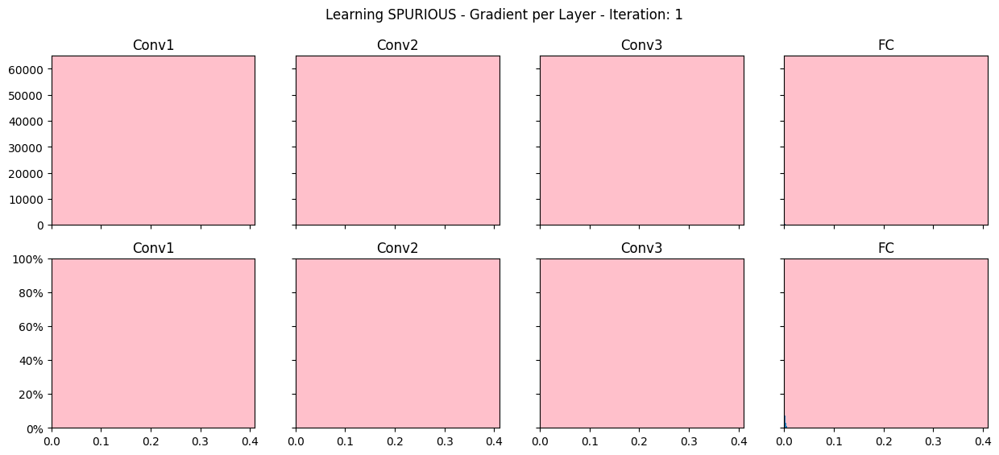

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter
from time import time
from matplotlib.ticker import PercentFormatter
# Create the figure and subplots
fig, axs = plt.subplots(2,4, figsize=(15,6), sharey='row', sharex='col')
n_bins = 20
# Define the update function for the animation
def update(frame):
    current_iteration = frame + 1
    
    for ax in axs.flatten():
        ax.clear()
        if current_iteration >= 75:
            fig.suptitle(f"Learning NON SPURIOUS - Gradient per Layer - Iteration: {current_iteration}")
            ax.set_facecolor("green")
        else:
            fig.suptitle(f"Learning SPURIOUS - Gradient per Layer - Iteration: {current_iteration}")
            ax.set_facecolor("pink")
            
    r, labels = parameters_to_vec(grads[frame])   
    r1 = filter_layer("conv1", r, labels)
    r2 = filter_layer("conv2", r, labels)
    r3 = filter_layer("conv3", r, labels)
    r4 = filter_layer("fc", r, labels)
    axs[0, 0].set_title(f"Conv1")
    axs[0, 1].set_title("Conv2")
    axs[0, 2].set_title("Conv3")
    axs[0, 3].set_title("FC")
    axs[0, 0].hist(r1, bins=n_bins)
    axs[0, 1].hist(r2, bins=n_bins)
    axs[0, 2].hist(r3, bins=n_bins) 
    axs[0, 3].hist(r4, bins=n_bins)
    axs[1, 0].set_title("Conv1")
    axs[1, 1].set_title("Conv2")
    axs[1, 2].set_title("Conv3")
    axs[1, 3].set_title("FC")
    axs[1, 0].hist(r1, weights=np.ones(len(r1)) / len(r1), bins=n_bins)
    axs[1, 1].hist(r2, weights=np.ones(len(r2)) / len(r2), bins=n_bins)
    axs[1, 2].hist(r3, weights=np.ones(len(r3)) / len(r3), bins=n_bins)
    axs[1, 3].hist(r4, weights=np.ones(len(r4)) / len(r4), bins=n_bins)
    for i in range(4):
        axs[1, i].yaxis.set_major_formatter(PercentFormatter(1))
        axs[0,i].set_ylim([0, 65000])
        axs[1,i].set_ylim([0, 1])
        axs[0,i].set_xlim([0, 0.41])
        axs[1,i].set_xlim([0, 0.41])
#ax.set_ylim(None)
start = time()
# Create the animation
animation = FuncAnimation(fig, update, frames=500, interval=1)

# Show the animation
FFwriter = FFMpegWriter(fps=2)
animation.save('animation1.mp4', writer = FFwriter)
#animation.save('sine_wave.gif', writer='imagemagick')
end = time()

print(f"Making animation took {end-start:.2f}s")

In [12]:
from tqdm.notebook import tqdm
cur_max = 0
cur_min = 1000000000
for i, g in enumerate(grads):
    r, labels = parameters_to_vec(g)
    m = max(r)
    if m > cur_max:
        cur_max = m
    print(f"\r{i+1}/{len(grads)}", end="")
        #if min(r) < cur_min:
    #    cur_min = min(r)
        
print(cur_min, cur_max)

1000/10001000000000 tensor(0.4109)


In [20]:
from collections import defaultdict
metrics = defaultdict(lambda: 0)
for g in grads:
    print(f"\r{100*(i+1)/len(grads)}%", end="")
    for k, v in g.items():
        m = v.max()
        if metrics[k] < m:
            metrics[k] = m
            
for k, v in metrics.items():
    print(f"{k}: {v}")

100.0%features.conv1.weight: 0.3673991560935974
features.conv1.bias: 0.41089147329330444
features.conv2.weight: 0.37457165122032166
features.conv2.bias: 0.2855318784713745
features.conv3.weight: 0.10316667705774307
features.conv3.bias: 0.0707254707813263
fc.0.weight: 0.1587880551815033
fc.0.bias: 0.08419458568096161


In [8]:
layers_vec = []
grads_vec = [parameters_to_vec(x)[0] for x in grads]
for x in grads:
    layers_vec += parameters_to_vec(x)[1] 

In [9]:
grads_vec = torch.stack(grads_vec)

In [11]:
mean_per_iteration = torch.cumsum(grads_vec, 0)

tensor([[3.4087e-05, 4.2711e-05, 1.3224e-04,  ..., 1.0122e-04, 1.0122e-04,
         4.3586e-03],
        [1.5751e-04, 7.6683e-05, 1.7113e-04,  ..., 1.0223e-04, 1.0223e-04,
         1.2114e-02],
        [3.1599e-03, 3.1802e-03, 3.4041e-03,  ..., 1.0223e-04, 1.0223e-04,
         3.8127e-02],
        ...,
        [2.5857e+01, 2.5912e+01, 2.6070e+01,  ..., 3.2743e+00, 3.2743e+00,
         1.9136e+01],
        [2.5871e+01, 2.5925e+01, 2.6082e+01,  ..., 3.2773e+00, 3.2773e+00,
         1.9145e+01],
        [2.5879e+01, 2.5933e+01, 2.6090e+01,  ..., 3.2798e+00, 3.2798e+00,
         1.9162e+01]])

In [14]:
3.4087e-05 + 1.2342e-04

0.000157507

In [12]:
grads_vec

tensor([[3.4087e-05, 4.2711e-05, 1.3224e-04,  ..., 1.0122e-04, 1.0122e-04,
         4.3586e-03],
        [1.2342e-04, 3.3972e-05, 3.8887e-05,  ..., 1.0087e-06, 1.0087e-06,
         7.7554e-03],
        [3.0024e-03, 3.1035e-03, 3.2330e-03,  ..., 0.0000e+00, 0.0000e+00,
         2.6013e-02],
        ...,
        [1.4113e-02, 1.3607e-02, 1.2152e-02,  ..., 6.7235e-04, 6.7235e-04,
         1.0497e-02],
        [1.3621e-02, 1.2498e-02, 1.2047e-02,  ..., 2.9389e-03, 2.9389e-03,
         9.1579e-03],
        [8.7988e-03, 7.9085e-03, 8.4962e-03,  ..., 2.5636e-03, 2.5636e-03,
         1.6976e-02]])

## Gradient comparison between Correlated and non Correlated samples

In [1]:
# Load pretrained model
# Let's do MNIST and create red and green versions of the same image
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision.transforms import Resize
from models import simplecnn
import torch.nn as nn
from torch.optim import SGD
from os.path import join
from collections import defaultdict
def get_grads(model):
    grads = dict()
    for name, param in model.named_parameters():
        if param.grad is not None:
            grads[name] = param.grad.clone().detach().cpu()
    return grads

def mean_nll(logits, y):
    return nn.functional.binary_cross_entropy_with_logits(logits, y)

def generate_sign_mask(g1, g2):
    mask = {}
    for key in g1.keys():
        mask[key] = (torch.sign(g1[key]) != torch.sign(g2[key])).float()
        
    return mask
# Load the MNIST dataset
train_dataset = torchvision.datasets.MNIST(root='../datasets', train=True, transform=None, download=True)
resize = Resize((32,32))
x = resize(train_dataset.data)
y = train_dataset.targets
sorted_indices = torch.argsort(y)
# sort x using the sorted indices
sorted_x = x[sorted_indices].float().unsqueeze(1).cuda()
sorted_y = y[sorted_indices].float().cuda()

z = torch.zeros_like(sorted_x)
r_imgs = torch.cat([sorted_x,z,z], dim=1).cuda()
g_imgs = torch.cat([z,sorted_x,z], dim=1).cuda()
# For visualization
layers = ['features.conv1.weight',
       #   'features.conv2.weight',
       #  'features.conv3.weight',
          'fc.0.weight']
layer_shape = {
    'features.conv1.weight': (-1, 3, 3, 1),
    'features.conv2.weight': (-1, 1, 3, 3),
    'features.conv3.weight': (-1, 1, 3, 3),
    'fc.0.weight': (-1, 1, 6, 6)  
}

layer_height = {
    'features.conv1.weight': 4,
    'features.conv2.weight': 32,
    'features.conv3.weight': 256*3,
    'fc.0.weight': 5 
}

In [2]:
%%time
masks = defaultdict(list)
spur_grads = defaultdict(list)
nonspur_grads = defaultdict(list)
for i, bs in enumerate(['bs','nobs']):
    percentages = defaultdict(list)
    for n_iter in range(6,1001,5):
        args = []
        root_models = "models"
        model_weights = torch.load(join(root_models, f"scnn_synmnist_0.875_nobg_{bs}_nofrz_{n_iter}_cmnist_baseline.pth"))
        m = simplecnn(args).cuda()
        m.load_state_dict(model_weights)
        opt = SGD(m.parameters(), lr=0.001)

        logits = m(r_imgs[0:30000]) # With Correlation
        loss = mean_nll(logits.squeeze(), sorted_y[0:30000])
        opt.zero_grad()
        loss.backward()
        # Get gradients
        spur_grads[bs].append(get_grads(m))
        logits = m(g_imgs[0:30000]) # Without Correlation
        loss = mean_nll(logits.squeeze(), sorted_y[0:30000])
        opt.zero_grad()
        loss.backward()
        # Get gradients
        nonspur_grads[bs].append(get_grads(m))

        mask = generate_sign_mask(spur_grads[bs][-1], nonspur_grads[bs][-1])
        masks[bs].append(mask)


CPU times: user 3min 20s, sys: 687 ms, total: 3min 21s
Wall time: 2min 52s


KeyError: 'bs'

Error in callback <function _draw_all_if_interactive at 0x7fc3b456e9e0> (for post_execute):


KeyError: 'bs'

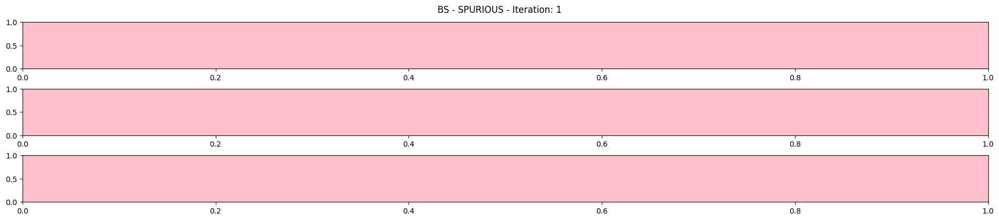

In [4]:
%%time 
#The spurious correlation is set as Red --> [0..4], Green --> [5..9]
from collections import defaultdict
from matplotlib.animation import FuncAnimation, FFMpegWriter

    

    
layer = "features.conv1.weight"

layers = ["features.conv1.weight","fc.0.weight"]

# Create the animation
for bs in ['bs','nobs']:
    
    def update(frame):
        current_iteration = 5*frame + 1
        # Limpiar
        for ax in axs.flatten():
            ax.clear()
            if current_iteration >= 176:
                fig.suptitle(f"{bs.upper()} - NON SPURIOUS - Iteration: {current_iteration}")
                ax.set_facecolor("green")
            else:
                fig.suptitle(f"{bs.upper()} - SPURIOUS - Iteration: {current_iteration}")
                ax.set_facecolor("pink")

        grid = torchvision.utils.make_grid(spur_grads[bs][frame][layer].view(layer_shape[layer]), normalize=True, nrow=32, scale_each=False, padding=1)
        axs[0].imshow(grid.permute(1,2,0))
        axs[0].axis('on')
        axs[0].xaxis.set_visible(False)
        grid = torchvision.utils.make_grid(nonspur_grads[bs][frame][layer].view(layer_shape[layer]), normalize=True, nrow=32, scale_each=False, padding=1)
        axs[1].imshow(grid.permute(1,2,0))
        axs[1].axis('on')
        axs[1].xaxis.set_visible(False)
        img = masks[bs][frame][layer].view(layer_shape[layer])
        #img = img.permute(0,2,1,3)
        grid = torchvision.utils.make_grid(img, normalize=True, nrow=32, scale_each=False, padding=1)
        axs[2].imshow(grid.permute(1,2,0))
        axs[2].axis('on')
        axs[2].xaxis.set_visible(False)

    for layer in layers:
        fig, axs = plt.subplots(nrows=3, constrained_layout=True)
        fig.set_size_inches(18.5,layer_height[layer])
        animation = FuncAnimation(fig, update, frames=199, interval=1)
        # Show the animation
        FFwriter = FFMpegWriter(fps=2)
        animation.save(f'animation_{bs}_{layer}.mp4', writer = FFwriter)
        #animation.save('sine_wave.gif', writer='imagemagick')



Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%


Layer: features.conv1.weight - 561.0/864 = 64.93%
Layer: features.conv1.weight - 561.0/864 = 64.93%
Layer: features.conv1.weight - 561.0/864 = 64.93%
Layer: features.conv1.weight - 561.0/864 = 64.93%
Layer: features.conv1.weight - 561.0/864 = 64.93%
Layer: features.conv1.weight - 558.0/864 = 64.58%
Layer: features.conv1.weight - 558.0/864 = 64.58%
Layer: features.conv1.weight - 558.0/864 = 64.58%
Layer: features.conv1.weight - 557.0/864 = 64.47%
Layer: features.conv1.weight - 557.0/864 = 64.47%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%
Layer: features.conv1.weight - 556.0/864 = 64.35%


Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 576.0/864 = 66.67%
Layer: features.conv1.weight - 574.0/864 = 66.44%


KeyboardInterrupt: 

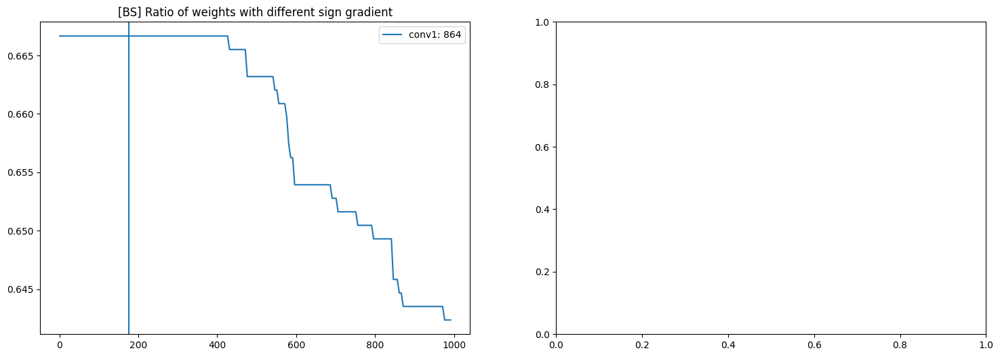

In [5]:
fig, axs = plt.subplots(ncols=2)
fig.set_size_inches(18,6)
for i, bs in enumerate(['bs','nobs']):
    percentages = defaultdict(list)
    for n_iter in range(6,1001,5):
        args = []
        root_models = "models"
        model_weights = torch.load(join(root_models, f"scnn_synmnist_0.875_nobg_{bs}_nofrz_{n_iter}_cmnist_baseline.pth"))
        m = simplecnn(args).cuda()
        m.load_state_dict(model_weights)
        opt = SGD(m.parameters(), lr=0.001)

        logits = m(r_imgs[0:30000]) # With Correlation
        loss = mean_nll(logits.squeeze(), sorted_y[0:30000])
        opt.zero_grad()
        loss.backward()
        # Get gradients
        spur_grads = get_grads(m)
        logits = m(g_imgs[0:30000]) # Without Correlation
        loss = mean_nll(logits.squeeze(), sorted_y[0:30000])
        opt.zero_grad()
        loss.backward()
        # Get gradients
        nonspur_grads = get_grads(m)

        mask = generate_sign_mask(spur_grads, nonspur_grads)
        percentages[layer].append(mask[layer].sum()/mask[layer].numel())
        print(f"Layer: {layer} - {mask[layer].sum()}/{mask[layer].numel()} = {100*mask[layer].sum()/mask[layer].numel():.2f}%")

    # Load pretrained model
    for k, v in percentages.items():
        label = k.replace(".weight","").replace("features.","")
        axs[i].plot([5*i + 1 for i in range(len(v))],v, label=f"{label}: {mask[k].numel()}")
        axs[i].axvline(x=176)
        axs[i].legend()

    axs[i].set_title(f"[{bs.upper()}] Ratio of weights with different sign gradient")


In [6]:
masks

defaultdict(list,
            {'bs': [{'features.conv1.weight': tensor([[[[1., 1., 1.],
                         [1., 1., 1.],
                         [1., 1., 1.]],
               
                        [[1., 1., 1.],
                         [1., 1., 1.],
                         [1., 1., 1.]],
               
                        [[0., 0., 0.],
                         [0., 0., 0.],
                         [0., 0., 0.]]],
               
               
                       [[[1., 1., 1.],
                         [1., 1., 1.],
                         [1., 1., 1.]],
               
                        [[1., 1., 1.],
                         [1., 1., 1.],
                         [1., 1., 1.]],
               
                        [[0., 0., 0.],
                         [0., 0., 0.],
                         [0., 0., 0.]]],
               
               
                       [[[1., 1., 1.],
                         [1., 1., 1.],
                         [1., 1., 1

features.conv1.weight
Layer: features.conv1.weight - 576.0/864 = 66.67%
features.conv2.weight
Layer: features.conv2.weight - 10197.0/18432 = 55.32%
fc.0.weight
Layer: fc.0.weight - 1200.0/4608 = 26.04%


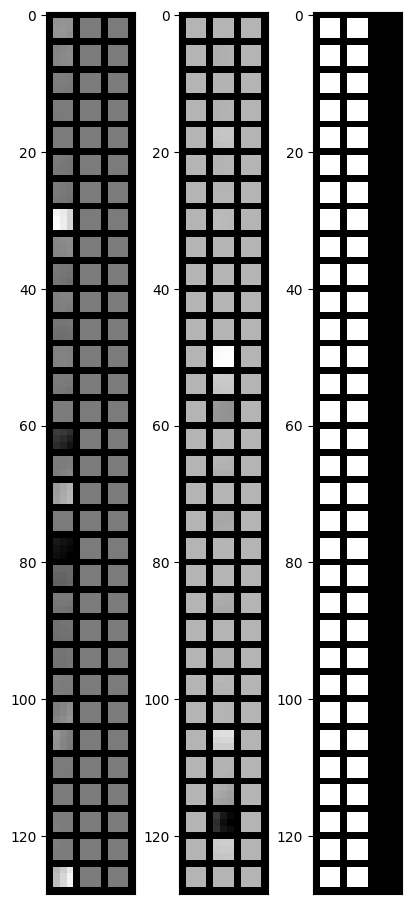

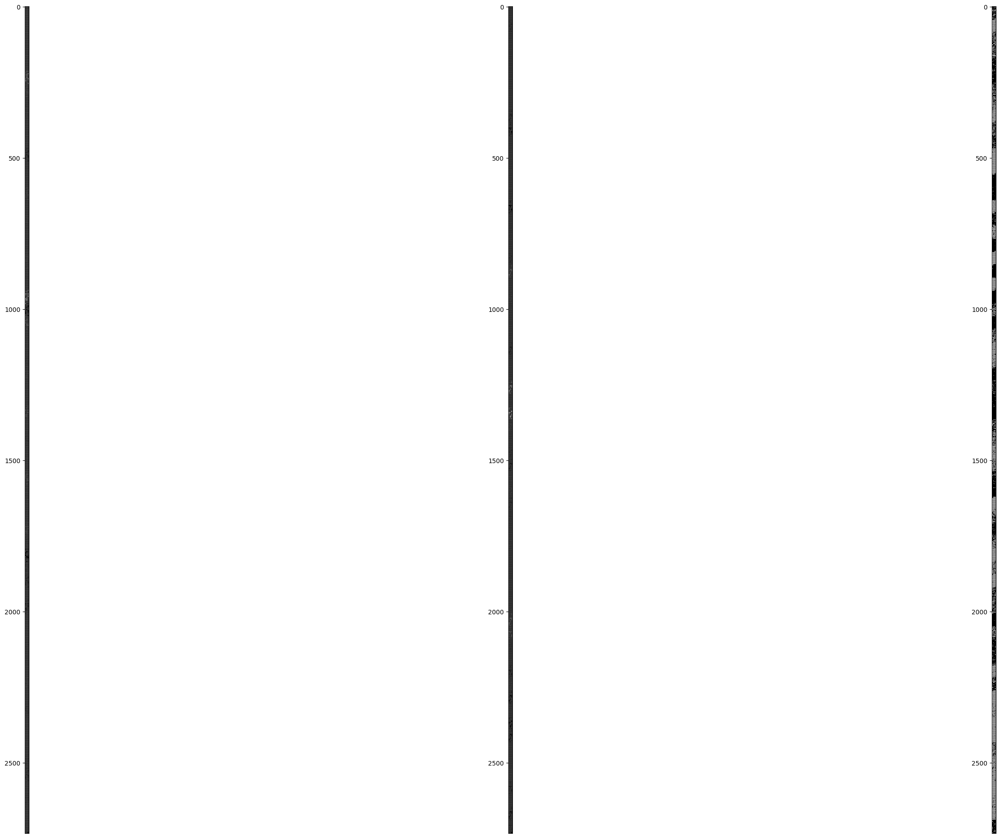

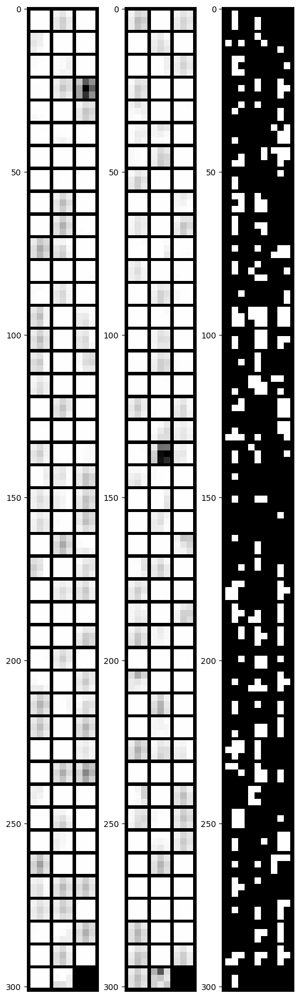

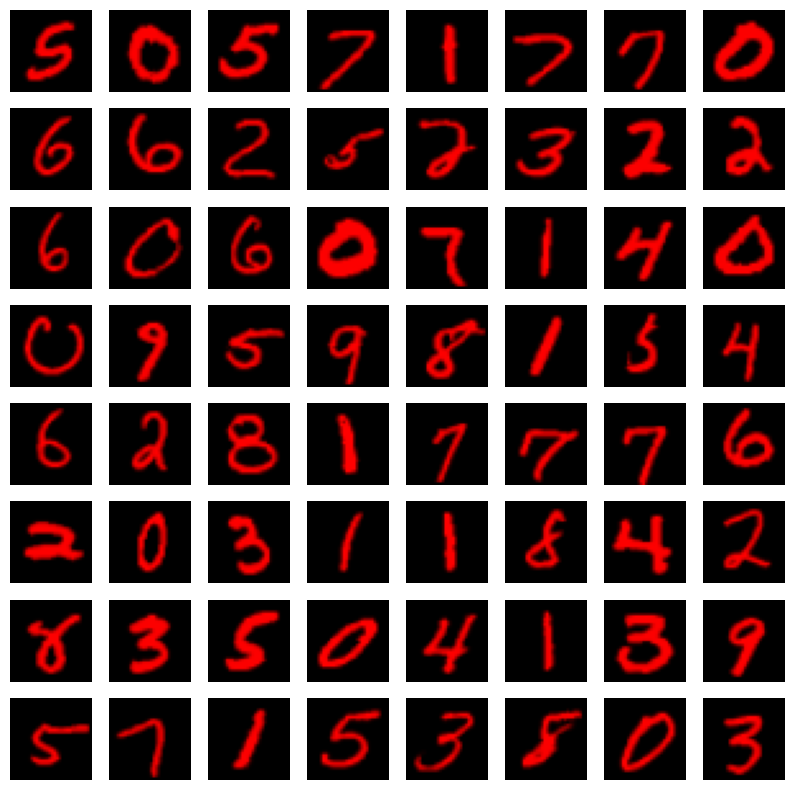

In [21]:
# Visualize the images
fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(10, 10))
for i in range(8):
    for j in range(8):
        ax[i][j].imshow(r_imgs[i * 8 + j].squeeze())
        ax[i][j].axis('off')
plt.show()


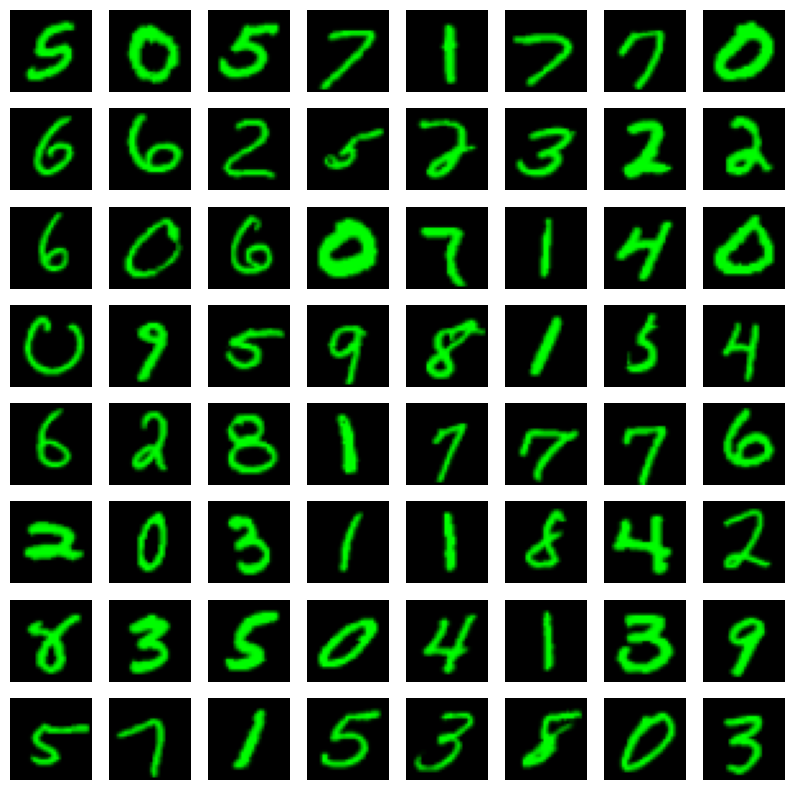

In [22]:
# Visualize the images
fig, ax = plt.subplots(nrows=8, ncols=8, figsize=(10, 10))
for i in range(8):
    for j in range(8):
        ax[i][j].imshow(g_imgs[i * 8 + j].squeeze())
        ax[i][j].axis('off')
plt.show()
